In [15]:
import numpy as np
from DPOD.datasets.linemod.models_handler import ModelsHandler
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

# Core functions

In [231]:
from itertools import product

def has_intersection(alpha, segments):
    """
    segments: shape (len, 2, 2)
    """
    angles = np.empty((segments.shape[0], 2))
    angles[:, 0] = np.arctan2(segments[:, 0, 1], segments[:, 0, 0])
    angles[:, 1] = np.arctan2(segments[:, 1, 1], segments[:, 1, 0])

#     print((np.sort(angles[:, 0]) - np.sort(angles[:, 1]))[np.sort(angles[:, 0] != np.sort(angles[:, 1]))])
    # make sure a0 >= a1
    change_required = angles[:, 0] < angles[:, 1]
    angles[change_required, 0], angles[change_required, 1] = angles[change_required, 1], angles[change_required, 0]
    assert np.all(angles[:, 0] >= angles[:, 1])
    
    orig_dist = angles[:, 0] - angles[:, 1]
    assert np.all(orig_dist >= 0)
    
    opt1 = np.logical_and(np.logical_and(alpha >= angles[:, 1], alpha <= angles[:, 0]),  orig_dist < np.pi)
    opt2 = np.logical_and(np.logical_or(alpha <= angles[:, 1], alpha >= angles[:, 0]), orig_dist >= np.pi)
    intersection = np.logical_or(opt1, opt2)
#     print(np.logical_and(alpha < angles[:, 1], alpha > angles[:, 0]))
#     print(orig_dist >= np.pi)
#     print(angles)
    
    return segments[intersection]

no_inter = 0

def find_intersection(alpha, all_segments):
    """
    segments: shape (len, 2, 2)
    """
    global no_inter
    r = np.random.rand(1)

    segments = has_intersection(alpha, all_segments)

    results = np.empty((segments.shape[0], 2))
    a = np.zeros(segments.shape[0])
    b = np.ones(segments.shape[0])
    
    xs_equal = segments[:, 0, 0] == segments[:, 1, 0]
    a[~xs_equal] = (segments[~xs_equal, 0, 1] - segments[~xs_equal, 1, 1]) / (segments[~xs_equal, 0, 0] - segments[~xs_equal, 1, 0])
    b[~xs_equal] = segments[~xs_equal, 1, 1] - (a[~xs_equal] * segments[~xs_equal, 1, 0])
    results[:, 0] = np.where(xs_equal, segments[:, 0, 0], b / (np.tan(alpha) - a))
    results[:, 1] = np.tan(alpha) * results[:, 0]
    
    ind = np.argsort((results ** 2).sum(axis=1))
    
    if len(results) == 0:
        assert len(segments) == 0
        no_inter += 1
#         if r[0] > 0.999:
#             plt.figure(figsize=(8,8))
#             for s in all_segments:
#                 plt.plot(s[:, 0], s[:, 1], color='gray')
#                 plt.scatter(s[0, 0], s[0, 1])
#                 betha = np.arctan2(s[1, 1], s[1, 0])
# #                 b_mul = -1 if betha > np.pi/2 or betha < -np.pi/2 else 1
#                 plt.plot([0, s[1, 0]], [0, s[1, 0] * np.tan(betha)], color=((betha + np.pi) / (2 *np.pi), 1 - (betha + np.pi) / (2 *np.pi), (betha + np.pi) / (2 *np.pi)))
#             for s in segments:
#                 plt.plot(s[:, 0], s[:, 1], color='red')
#             a_mul = -1 if alpha > np.pi/2 or alpha < -np.pi/2 else 1
#             plt.plot([0, 0.02*a_mul], [0, 0.02 * np.tan(alpha)], color='pink')
#             plt.show()
        return np.zeros(2)
    else:
        return results[ind[-1]]

def new_reversed_mapping_old(mh, model_name):
    global no_inter
    no_inter = 0
    eps = 1e-4
    ver = mh.get_vertices(model_name)
    facs = mh.get_faces(model_name)
    facs = ver[facs]
    fh_min = facs[:, :, 1].min(axis=1)
    fh_max = facs[:, :, 1].max(axis=1)
    mh.color_resolution = 16
    mapping = np.empty((mh.color_resolution, mh.color_resolution, 3))
    for i_idx, j_idx in tqdm(product(range(mh.color_resolution), range(mh.color_resolution)), total = mh.color_resolution**2):
        i = i_idx / mh.color_resolution
        j = j_idx / mh.color_resolution
        mini, maksi = mh.model_h_min_max[model_name]
        height = i * (maksi - mini - 2*eps) + mini + eps # shrunk height span to get rid of equalities in equations below
        alpha = j * 2 * np.pi - np.pi
        curr_facs = facs[np.logical_and(fh_min < height, fh_max > height)]
        segments = np.empty((curr_facs.shape[0], 3, 2, 3))
        segments[:, 0] = curr_facs[:,[0,1]]
        segments[:, 1] = curr_facs[:,[1,2]]
        segments[:, 2] = curr_facs[:,[2,0]]
        s_min = segments[:,:,:, 1].min(axis=2)
        s_max = segments[:,:,:, 1].max(axis=2)
        segments = segments[np.logical_and(s_min < height, s_max > height)].reshape(-1, 2, 2, 3)
        x_cord = segments[:, :, 0, 0] + \
            (segments[:, :, 1, 0] - segments[:, :, 0, 0]) / (segments[:, :, 1, 1] - segments[:, :, 0, 1]) * \
            (height - segments[:, :, 0, 1])
        z_cord = segments[:, :, 0, 2] + \
            (segments[:, :, 1, 2] - segments[:, :, 0, 2]) / (segments[:, :, 1, 1] - segments[:, :, 0, 1]) * \
            (height - segments[:, :, 0, 1])
#         if (i_idx > 25 and j_idx > 25):
#             for x, z in zip(x_cord, z_cord):
#                 plt.plot(x, z)
#             plt.plot([0, 0.001], [0, np.tan(alpha)*0.001])
#             plt.show()
#             break
        
        seg_2d = np.stack([x_cord, z_cord], axis=-1)
        res = find_intersection(alpha, seg_2d)
        mapping[i_idx, j_idx] = np.array([res[0], height, res[1]])
    print("No inter", no_inter)
    return mapping

def new_reversed_mapping_newer(mh, model_name):
    global no_inter
    no_inter = 0
    eps = 1e-4
    ver = mh.get_vertices(model_name)
    facs = mh.get_faces(model_name)
    sections = np.concatenate([facs[:, [0,1]], facs[:, [0, 2]], facs[:, [1,2]]])
    change_required = sections[:, 0] < sections[:, 1]
    tmp = sections[:, 0]
    sections[:, 0] = np.where(change_required, sections[:, 1], sections[:, 0])
    sections[:, 1] = np.where(change_required, tmp, sections[:, 1])
    assert np.all(sections[:, 0] >= sections[:, 1])
    sections = np.unique(sections, axis=0)
    print(sections.shape)

    facs = ver[sections]
    fh_min = facs[:, :, 1].min(axis=1)
    fh_max = facs[:, :, 1].max(axis=1)
    mh.color_resolution = 16
    mini, maksi = mh.model_h_min_max[model_name]
    mapping = np.empty((mh.color_resolution, mh.color_resolution, 3))
    for i_idx, j_idx in tqdm(product(range(mh.color_resolution), range(mh.color_resolution)), total = mh.color_resolution**2):
        i = i_idx / mh.color_resolution
        j = j_idx / mh.color_resolution
        height = i * (maksi - mini - 2*eps) + mini + eps # shrunk height span to get rid of equalities in equations below
        alpha = j * 2 * np.pi - np.pi
        curr_facs = facs[np.logical_and(fh_min < height, fh_max > height)]
        print(curr_facs.shape)
        segments = curr_facs
#         segments = np.empty((curr_facs.shape[0], 3, 2, 3))
#         segments[:, 0] = curr_facs[:,[0,1]]
#         segments[:, 1] = curr_facs[:,[1,2]]
#         segments[:, 2] = curr_facs[:,[2,0]]
#         s_min = segments[:,:,:, 1].min(axis=2)
#         s_max = segments[:,:,:, 1].max(axis=2)
#         segments = segments[np.logical_and(s_min < height, s_max > height)].reshape(-1, 2, 2, 3)
        x_cord = segments[:, 0, 0] + \
            (segments[:, 1, 0] - segments[:, 0, 0]) / (segments[:, 1, 1] - segments[:, 0, 1]) * \
            (height - segments[:, 0, 1])
        z_cord = segments[:, 0, 2] + \
            (segments[:, 1, 2] - segments[:, 0, 2]) / (segments[:, 1, 1] - segments[:, 0, 1]) * \
            (height - segments[:, 0, 1])

        
        points = np.stack([x_cord, z_cord], axis=-1)
        ind = np.argsort(np.arctan2(points[:, 1], points[:, 0]))
        seg_2d = np.stack([points[ind[:-1]], points[ind[1:]]], axis=1)
        print(seg_2d.shape)
        if (i_idx > 2 and j_idx > 2):
            plt.plot(points[ind, 0], points[ind, 1])
#             plt.plot([0, 0.001], [0, np.tan(alpha)*0.001])
            plt.show()
            break
#         res = find_intersection(alpha, seg_2d)
#         mapping[i_idx, j_idx] = np.array([res[0], height, res[1]])
#     print("No inter", no_inter)
#     return mapping

def new_reversed_mapping(mh, model_name, reversed_arctan=False):
    global no_inter
    no_inter = 0
    eps = 0
    ver = mh.get_vertices(model_name)
    facs = mh.get_faces(model_name)
#     print("faces", facs.shape, facs[:5])
    sections = np.concatenate([facs[:, [0,1]], facs[:, [0, 2]], facs[:, [1,2]]])
#     print("repets", sections[sections[:, 0] == sections[:, 1]])
    face_num = np.concatenate([np.arange(len(facs))] * 3)
    
    change_required = sections[:, 0] < sections[:, 1]
    sections[change_required, 0], sections[change_required, 1] = sections[change_required, 1], sections[change_required, 0]
    assert np.all(sections[:, 0] >= sections[:, 1])
#     print("repets sorted", sections[sections[:, 0] == sections[:, 1]])
    sections, sections_inverse = np.unique(sections, axis=0, return_inverse=True)

    facs = ver[sections]
    fh_min = facs[:, :, 1].min(axis=1)
    fh_max = facs[:, :, 1].max(axis=1)
    mini, maksi = mh.model_h_min_max[model_name]
    mapping = np.empty((mh.color_resolution, mh.color_resolution, 3))
    for i_idx, j_idx in tqdm(product(range(mh.color_resolution), range(mh.color_resolution)), total = mh.color_resolution**2):
        i = i_idx / mh.color_resolution
        j = j_idx / mh.color_resolution
        height = i * (maksi - mini - 2*eps) + mini + eps # shrunk height span to get rid of equalities in equations below
        alpha = j * 2 * np.pi - np.pi
        chosen_sections_bool = np.logical_and(fh_min <= height, fh_max >= height)
        curr_facs = facs[np.logical_and(fh_min <= height, fh_max >= height)]
        segments = curr_facs
        x_cord = segments[:, 0, 0] + \
            (segments[:, 1, 0] - segments[:, 0, 0]) / (segments[:, 1, 1] - segments[:, 0, 1]) * \
            (height - segments[:, 0, 1])
        z_cord = segments[:, 0, 2] + \
            (segments[:, 1, 2] - segments[:, 0, 2]) / (segments[:, 1, 1] - segments[:, 0, 1]) * \
            (height - segments[:, 0, 1])

        points = np.stack([x_cord, z_cord], axis=-1)
        
        inflated_points = np.zeros((facs.shape[0], 2))
        inflated_points[chosen_sections_bool] = points
        face_points = inflated_points[sections_inverse]
        non_zero_face_points = face_points[chosen_sections_bool[sections_inverse]]
        curr_facs_num = face_num[chosen_sections_bool[sections_inverse]]
        face_sort_ind = np.argsort(curr_facs_num)
        final_segments = non_zero_face_points[face_sort_ind].reshape(-1, 2, 2)

        if reversed_arctan:
            final_segments[:, 0], final_segments[:, 1] = final_segments[:, 1], final_segments[:, 0]
            
        res = find_intersection(alpha, final_segments)
        mapping[i_idx, j_idx] = np.array([res[0], height, res[1]])
    print("No inter", no_inter)
    return mapping

# Tests

In [233]:
mh = ModelsHandler(models_dir_path='models_small')

{'Ape': 1, 'Can': 2, 'Cat': 3, 'Driller': 4, 'Duck': 5, 'Eggbox': 6, 'Glue': 7}


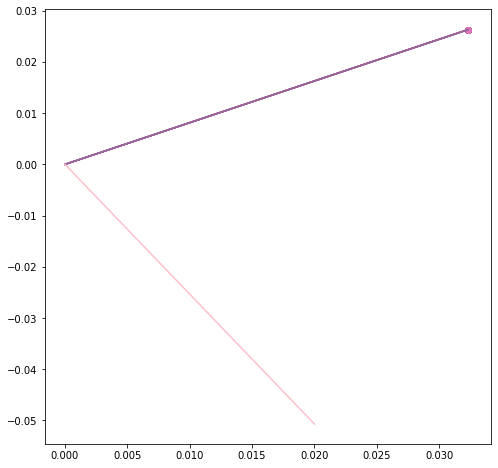

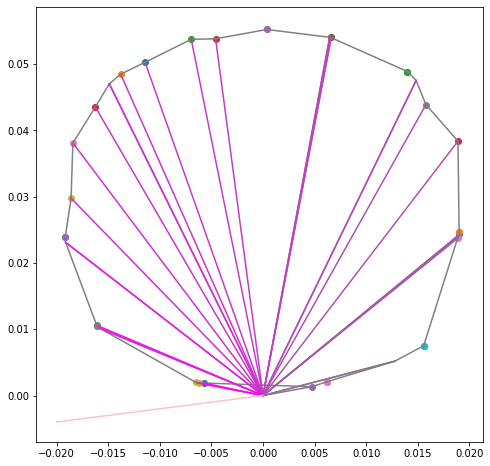

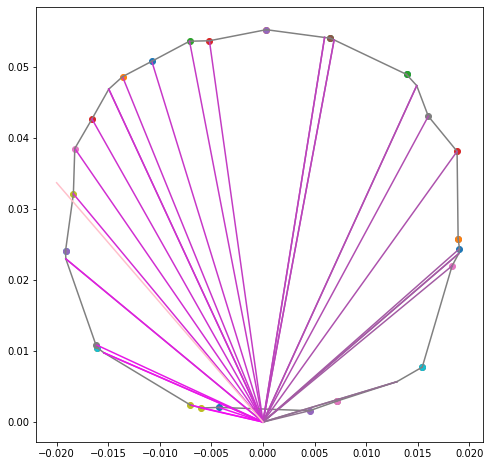

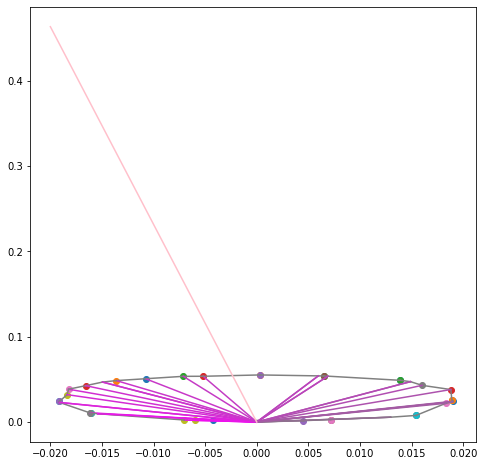

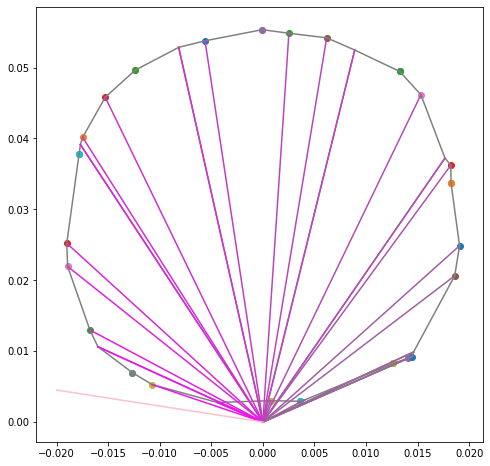

...

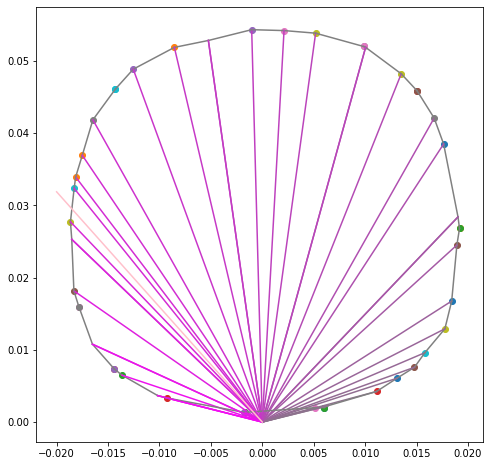

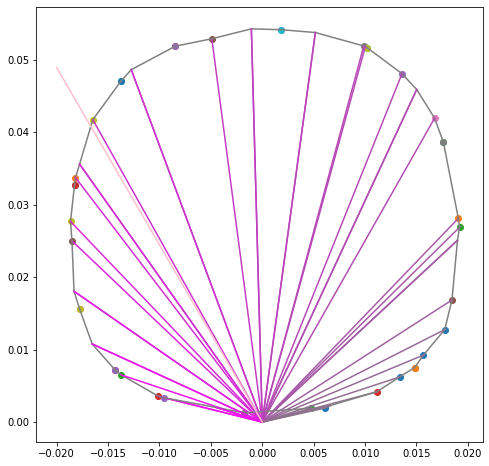

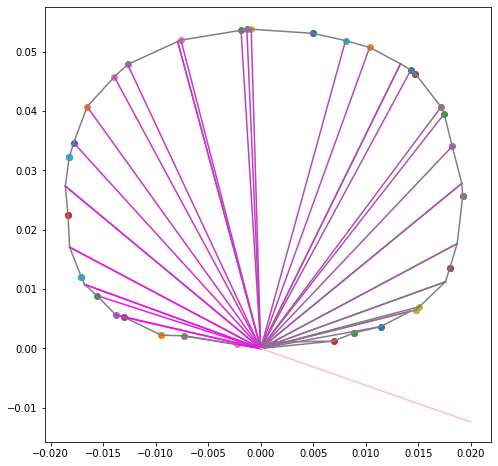

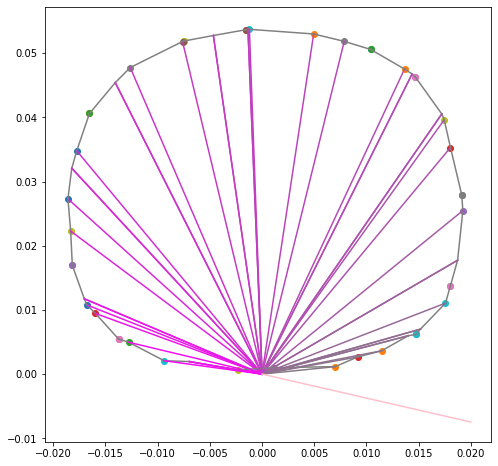

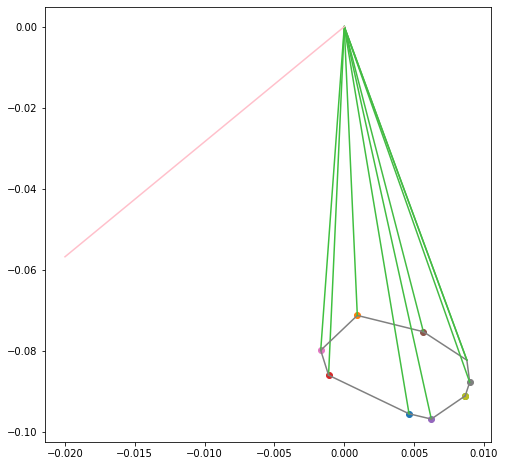


No inter 11306


In [225]:
mapping = new_reversed_mapping(mh, "Driller")

In [238]:
res = []
for i, j in product(range(mh.color_resolution), range(mh.color_resolution)):
    p = mapping[i, j]
    n = np.array([mapping[i-1, j], mapping[(i+1) % mh.color_resolution, j], mapping[i, j-1], mapping[i, (j+1) % mh.color_resolution]])
    diff = (n - p) ** 2
    diff = diff.sum(axis=1)
    res.append(diff.mean())
sum(res) / len(res)

9.039079887382287e-05

In [226]:
import plotly.graph_objects as go

# idx = np.array(list(product(range(255), range(255))))

points_observed = mapping.reshape(-1, 3)
# mh.get_color_to_3dpoints_arrays("Driller")[
#         observed_colors[:, 0], observed_colors[:, 1]]
fig = go.Figure(data=[go.Scatter3d(x=points_observed[:, 0], 
                                   y=points_observed[:, 2],
                                   z=points_observed[:, 1], 
                                   mode='markers',
                                   marker=dict(color=np.concatenate([np.arange(255)] * 255, axis=0),size=1),    
                                  )])
# fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

In [210]:
np.repeat(np.arange(64), 64)

array([ 0,  0,  0, ..., 63, 63, 63])

In [12]:
import plotly.graph_objects as go

ver = mh.get_vertices("Driller")


# idx = np.array(list(product(range(255), range(255))))

points_observed = mapping.reshape(-1, 3)
# mh.get_color_to_3dpoints_arrays("Driller")[
#         observed_colors[:, 0], observed_colors[:, 1]]
fig = go.Figure(data=[go.Scatter3d(x=ver[:, 0], 
                                   y=ver[:, 2],
                                   z=ver[:, 1], 
                                   mode='markers',
                                  )])
# fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

(9, 2, 2)


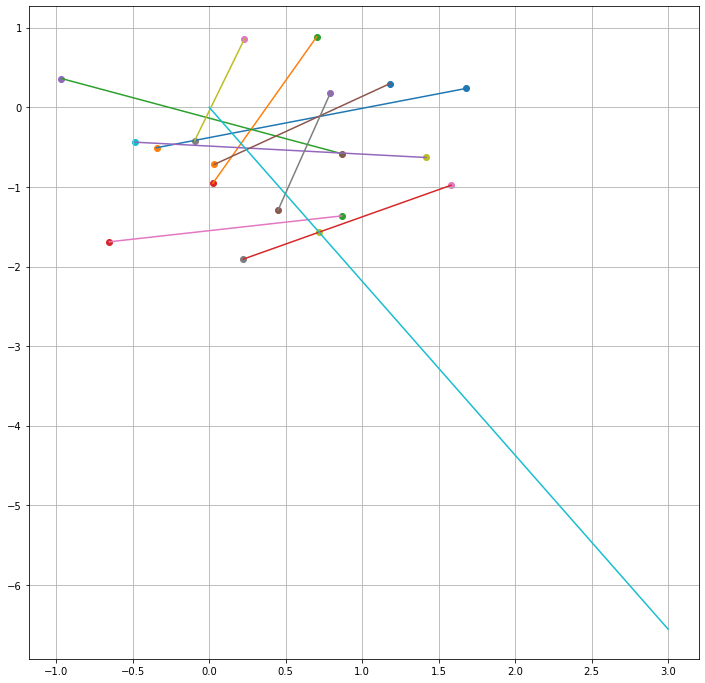

In [105]:
x = np.random.randn(100, 2, 2)
seg = has_intersection(np.arctan2(3*np.tan(2), 3), x)

print(seg.shape)

import matplotlib.pyplot as plt
plt.figure(figsize=(12,12))

for s in seg:
    plt.plot(s[:, 0], s[:, 1])
    plt.scatter(s[0,0], s[0, 1], label=f"{np.arctan2(s[0,1], s[0, 0])}")
    plt.scatter(s[1,0], s[1, 1], label=f"{np.arctan2(s[1,1], s[1, 0])}")
    a = np.arctan2(s[0,1], s[0, 0])
#     plt.plot([0, s[0, 0]], [0, s[0,0]*np.tan(a)], color="blue")
    
plt.plot([0, 3], [0, 3*np.tan(2)])
inter = find_intersection(np.arctan2(3*np.tan(2), 3), x)
plt.scatter(inter[0], inter[1])
plt.grid()
# plt.figure(figsize=(12,12))

# for s in seg:
# #     plt.plot(s[:, 0], s[:, 1])
#     plt.scatter(s[0,0], s[0, 1], label=f"{np.arctan2(s[0,1], s[0, 0])}")
#     plt.scatter(s[1,0], s[1, 1], label=f"{np.arctan2(s[1,1], s[1, 0])}")
plt.show()

# plt.plot([0, -3], [0, -3*np.tan(-0.3)])
# print("arctan2", np.arctan2(-3*np.tan(-0.3), -3))
# plt.grid()
# plt.legend()
# plt.show()

# Create reversed mapping

In [236]:
import os
from tqdm.notebook import tqdm
import numpy as np
from DPOD.datasets.linemod.models_handler import ModelsHandler
from DPOD.datasets.linemod.models_handler import get_reversed_mapping
from glob import glob

DIRECTORY_NAME = "test"

for model_dir in glob(f'models_small/*'):
    model_name = os.path.split(model_dir)[1]
    if 'Holepuncher' in model_dir:
        continue
    mapping = new_reversed_mapping(mh, model_name)
    
    os.makedirs(f"{DIRECTORY_NAME}/{model_name}", exist_ok=True)
    np.save(f"{DIRECTORY_NAME}/{model_name}/mapping.npy", mapping)
    print(f"Done {model_name}")


No inter 398
Done Ape



No inter 13888
Done Cat



No inter 19973
Done Can



No inter 1484
Done Eggbox



No inter 959
Done Duck



No inter 259
Done Glue



No inter 11306
Done Driller


In [109]:
np.unique(np.array([[1,1], [1,1], [1,0]]), axis=0)

array([[1, 0],
       [1, 1]])

In [146]:
np.concatenate([np.arange(4)] * 3)

array([0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3])

In [149]:
np.where(np.array([True, False, True]))

(array([0, 2]),)

In [152]:
np.repeat(np.arange(3), 2).reshape(-1, 2)

array([[0, 0],
       [1, 1],
       [2, 2]])